In [1]:
import webbpsf
import matplotlib.pylab as plt
import poppy
import numpy as np
import matplotlib.pylab as plt
from astropy.io import fits
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.visualization import LinearStretch, LogStretch, AsinhStretch
import os
from astropy.modeling import models, fitting
import astropy
import datetime

In [97]:
!pwd

/Users/melendez/WFSC_Flight


# JWST Using Wavefronts Measured On Orbit
### WebbPSF now includes code for using the results of in-flight wavefront sensing measurements, by retrieving Optical Path Difference (OPD) 

https://webbpsf.readthedocs.io/en/latest/jwst_measured_opds.html

## Index
* [Finding the measured wavefront near a given date](#opd)
* [Delta wfe Around Time](#delta)
* [Trending Wavefront Changes over Time](#trending)
* [Wavefront time series and histogram plots](#time)
* [Load a Single OPD](#single)
* [JWST PSF Subtraction Using in-flight Simulations](#psfsub)
* [PSF properties and differences ](#psfdiff)
* [Improved IFU Sims](#ifu)


For other WebbPSF examples:
https://webbpsf.readthedocs.io/en/latest/more_examples.html

In [3]:
#Let's get the latest webbpsf-data 
print("Downloading data...")
!wget  https://stsci.box.com/shared/static/qxpiaxsjwo15ml6m4pkhtk36c9jgj70k.gz -O ./webbpsfdata.tar.gz
print("Extracting data...")
!tar zxf ./webbpsfdata.tar.gz -C ~/
!rm ./webbpsfdata.tar.gz
print("Finished.")

wget: Command not found.
Extracting data...
tar: Error opening archive: Failed to open './webbpsfdata.tar.gz'
rm: ./webbpsfdata.tar.gz: No such file or directory
Finished.


In [2]:
#set your WebbPSF data folder
# webbpsf-data-LATEST.tar.gz 
# https://stsci.box.com/shared/static/qxpiaxsjwo15ml6m4pkhtk36c9jgj70k.gz
webbpsf.__path__
%env WEBBPSF_PATH=./webbpsf-data/
os.environ["WEBBPSF_PATH"]

# Optional: some functions allows the user to set your output folder when working with OPDs. Default: $WEBBPSF_PATH
# 
output_path = "<your_own_path>"

env: WEBBPSF_PATH=/Users/melendez/WFSC_Flight/webbpsf-data/


<a id='opd'></a>
### Finding the measured wavefront near a given date

In [33]:
nrc = webbpsf.NIRCam()
nrc.filter='F200W'

nrc.detector = 'NRCB2'
nrc.detector_position = (1024,1024)

The interpixel capacitance effect is now included for oversampled outputs as well as for the detector-sampled outputs (in the geometric distortion extension). Remember that, in general, the last (“DET_DIST”) FITS extension of the output PSF FITS file are the output data product that most represents the PSF as actually observed on a detector.
In any case, there are way to disable any detector effects or to adjust the empirical approximation of charge difussion. For example:
`nrc.options['charge_diffusion_sigma'] = 0`

`nrc.options['add_ipc'] = False`


MAST OPD query around UTC: 2022-07-01T00:00:00.000
                        MJD: 59761.0

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022063002-NRCA3_FP1-2.fits
	Date (MJD):	 59759.6628
	Delta time:	 -1.3372 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022070403-NRCA3_FP1-0.fits
	Date (MJD):	 59761.5484
	Delta time:	 0.5484 days
User requested choosing OPD time closest in time to 2022-07-01T00:00:00.000, which is R2022070403-NRCA3_FP1-0.fits, delta time 0.548 days
Importing and format-converting OPD from /ifs/jwst/tel/flight/WebbPSF-OPD/R2022070403-NRCA3_FP1-0.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point


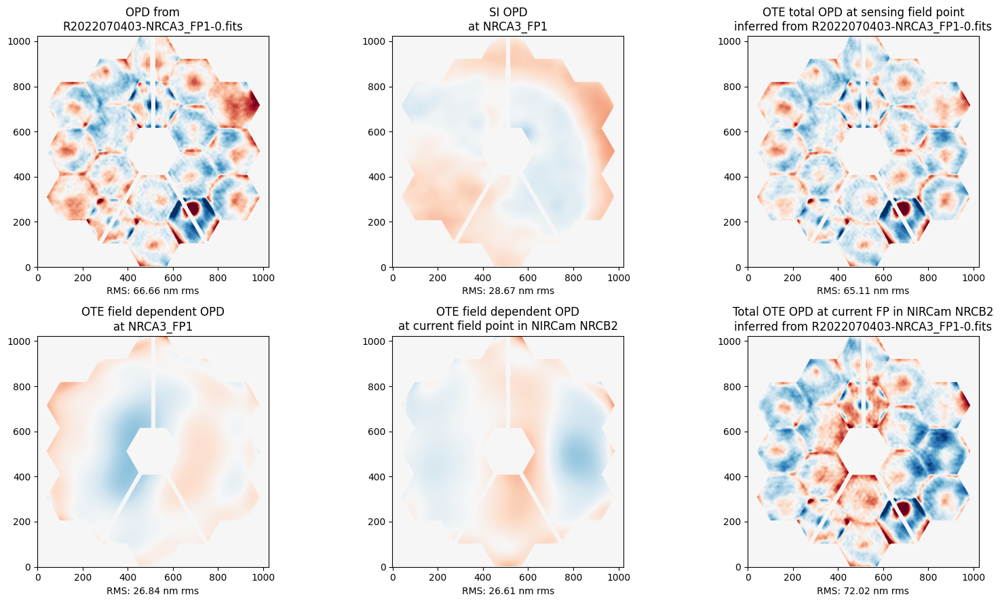

In [6]:
nrc.load_wss_opd_by_date('2022-07-01T00:00:00',plot=True, output_path = output_path)
#choice : string . Default 'closest'
#Method to choose which OPD file to use, e.g. 'before', 'after'

- Upper Left: This is the measured OPD as sensed in NIRCam at “field point 1” which is in the upper left corner of NRCA3, relatively close to the center of the NIRCam module. This observatory total OPD measurement includes both the telescope and NIRCam contributions to the WFE.

- Upper Middle: This is the wavefront map for the NIRCam portion of the WFE at that field point. This is known from ground calibration test data, not measured in flight.

- Upper Right: That NIRCam WFE contribution is subtracted from the total observatory WFE to yield this estimate of the OTE-only portion of the WFE.

- Lower Left and Middle: These are models for the field dependence of the OTE OPD between the sensing field point in NRCA3 and the requested field ooint, in this case in NRCB2. This field dependence arises mostly from the figure of the tertiary mirror. These are used to transform the estimated OTE OPD from one field position to another.

- Lower Right: This is the resulting estimate for the OTE OPD at the requested field point, in this case in NRCB2.

Filename: /ifs/jwst/tel/flight/WebbPSF-OPD/R2022070403-NRCA3_FP1-0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      23   ()      
  1  RESULT_PHASE    1 ImageHDU       184   (256, 256)   float32   
  2  RESULT_PSF    1 ImageHDU        11   (545, 545)   float32   
  3  EXPECTED      1 ImageHDU        13   (256, 256)   float32   
  4  PUPIL_MASK    1 ImageHDU        11   (256, 256)   int16   
  5  RAW_PSF       1 ImageHDU        14   (256, 256)   float32   
  6  CALC_PSF      1 ImageHDU        12   (546, 546)   float32   
  7  CALC_AMP      1 ImageHDU        12   (256, 256)   float32   
  8  HO_PHASE      1 ImageHDU        12   (256, 256)   float32   
  9  LO_PHASE      1 ImageHDU        12   (256, 256)   float32   
 10  RAW_PSF       1 ImageHDU        14   (256, 256)   float32   
 11  CALC_PSF      1 ImageHDU        12   (546, 546)   float32   
 12  CALC_AMP      1 ImageHDU        12   (256, 256)   float32   
 13  HO_PHASE      1 Im

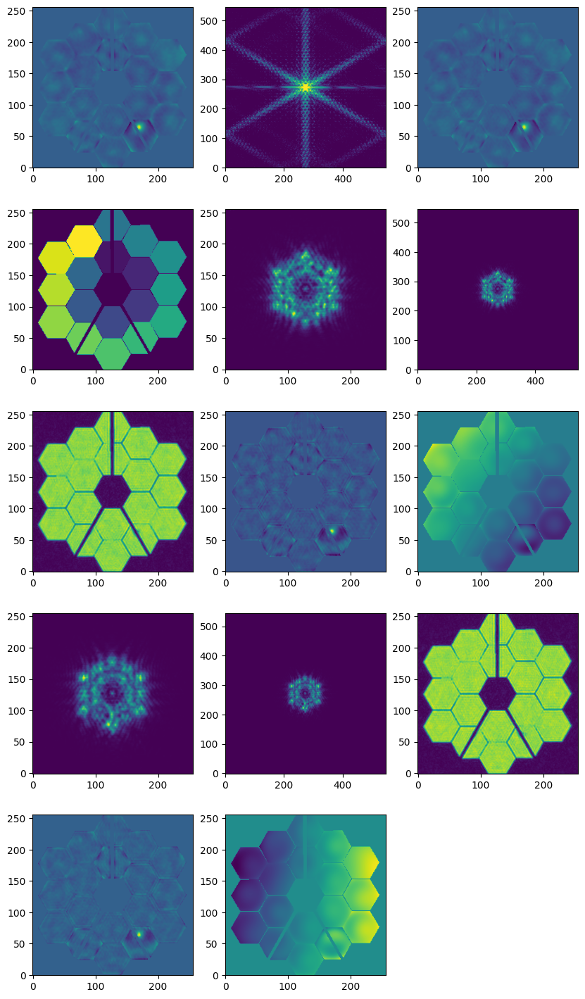

In [7]:
#What's inside an OPD?

opd_fn = 'R2022070403-NRCA3_FP1-0.fits'
opd = fits.open(os.path.join(output_path,opd_fn))

opd.info()



norm = ImageNormalize(stretch=LogStretch(), vmin = 1e-10 , vmax = 1e-6)
plt.figure(figsize = [10,18])
for i in range(1,len(opd)):
    plt.subplot(5,3,i)
    if i == 2:
        plt.imshow(opd[i].data, norm = norm, origin = 'lower')
    else:
        plt.imshow(opd[i].data, origin = 'lower')




## OPD File description

- RESULT_PHASE Image Extension. 
The FITS file contains a ‘RESULT’ image extension, which is the average of the optical path difference results from all images analyzed together in the phase retrieval 

- RESULT_PSF Image Extension 
The FITS file contains a ‘RESULT_PSF’ image extension, which is the PSF computed from the resultant phase by the WAS 

- EXPECTED Image Extension
The FITS file contains an ‘EXPECTED’ image extension, which is the expected optical path difference if the WAS-recommended correction is applied 

- PUPIL_MASK Image Extension 
The FITS file contains a ‘PUPIL_MASK’ image extension, which is the pupil mask used to compute the PSF from the resultant phase 


### The FITS file contains five image extensions for each analyzed input image. In the case of the sensing program, there are 2 images +/-8WL


- RAW_PSF Image Extensions 
For each input image, the Raw PSF extension will contain the raw extracted subimage taken from the calibrated science data 

- CALC_PSF Image Extensions 
For each input image, the Calculated PSF extension will contain an image which represents the estimated PSF as calculated by the phase retrieval process 

- CALC_AMP Image Extension 
For each input image, the Calculated Amplitude extension will contain an image which represents the estimated pupil amplitude as calculated by the phase retrieval process 

- HO_PHASE Image Extension 
For each input image, the High-Order Phase extension will contain an image which represents the retrieved phase information minus the Low-Order (controllable) phase as calculated by the phase retrieval process. 

- LO_PHASE Image Extension 
For each input image, the Low-Order Phase extension will contain an image which represents the retrieved controllable phase information as calculated by the phase retrieval process 



In [8]:
#Let's simulate Webb's PSF from the OPD above
# The PSF below is calculated using the actual 
# as-measured-at-L2 state of the telescope WFE near 
# the requested date, in this case 2022 July 1.
psf = nrc.calc_psf(fov_pixels=101)


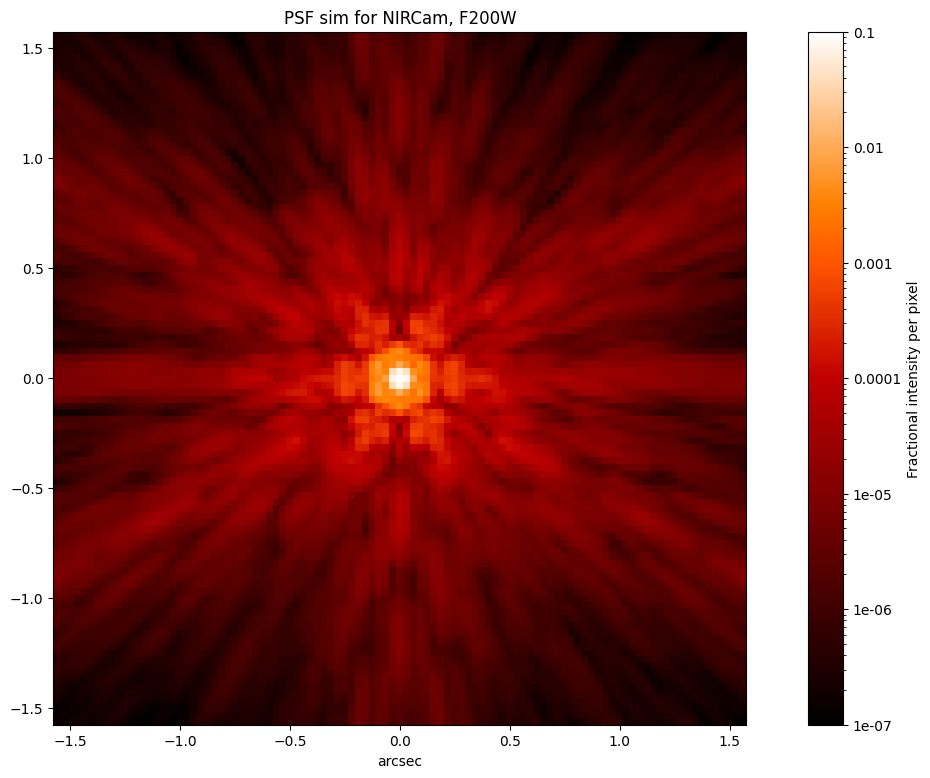

In [9]:
plt.figure(figsize=(16,9))
webbpsf.display_psf(psf, ext=1)

<a id='delta'></a>
# Delta wfe Around Time of Observation

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

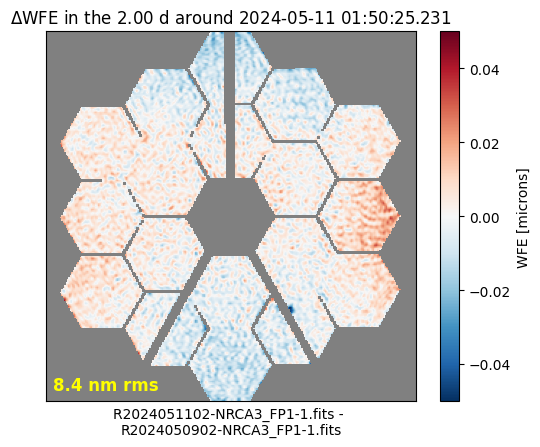

In [30]:
webbpsf.trending.delta_wfe_around_time('2024-05-11 01:50:25.231')

# Let's setup a PSF simulation by using a particular observation

In [34]:
def mast_retrieve_files(filename, output_path=None, verbose=False, redownload=False, token = None):
    """Download files from MAST.
    If file is already present locally, the download is skipped and the cached file is used.
    """
    import os
    from requests.exceptions import HTTPError
    from astroquery.mast import Mast
    if token:
        Mast.login(token = token)

    if output_path is None:
        output_path = '.'
    else:
        output_path = output_path

    output_filename = os.path.join(output_path, filename)

    if not os.path.exists(output_path):
        os.mkdir(output_path)

    if os.path.exists(output_filename) and not redownload:
        if verbose:
            print(f"Found file previously downloaded: {filename}")
        return output_filename

    data_uri = f'mast:JWST/product/{filename}'

    # Download the file
    url_path = Mast._portal_api_connection.MAST_DOWNLOAD_URL
    try:
        Mast._download_file(url_path + "?uri=" + data_uri, output_filename)
    except HTTPError as err:
        print(err)
    return output_filename

In [39]:
file = 'jw04500-o056_t012_nircam_f212n-wlm8-nrca3_wfscmb-04.fits'
mast_retrieve_files(file)

'./jw04500-o056_t012_nircam_f212n-wlm8-nrca3_wfscmb-04.fits'

Setting up sim to match jw04500-o056_t012_nircam_f212n-wlm8-nrca3_wfscmb-04.fits
iterating query, tdelta=3.0
iterating query, tdelta=6.0
Could not find JWST OPDs both before and after the specified date. Date outside of the available range of WFS data.
Found at least one OPD before that date, but no OPD after that date.

MAST OPD query around UTC: 2024-07-07T13:31:40.751
                        MJD: 60498.56366609954

Only found one OPD file when searching  :
URI -- mast:JWST/product/O2024070701-NRCA3_FP1-1.fits
Date (MJD) -- 60498.56366550926
User requested choosing OPD time closest in time to 2024-07-07T13:31:40.751, which is O2024070701-NRCA3_FP1-1.fits, delta time -0.000 days
Importing and format-converting OPD from /Users/melendez/WFSC_Flight/webbpsf-data/MAST_JWST_WSS_OPDs/O2024070701-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: NIRCam
    Filter: F212N
    Detector: NRCA3
    Ape

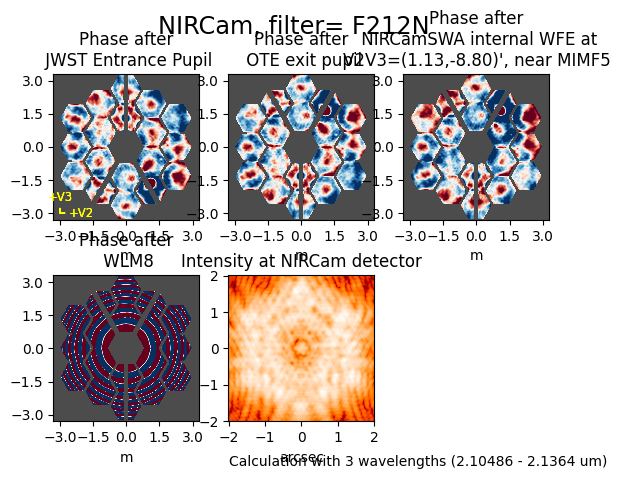

In [40]:
inst = webbpsf.setup_sim_to_match_file(file)
position = (512,1024) # source position
size_pixels = 128 # size in pixels
inst.detector_position = position

single_webbpsf_nrc = inst.calc_psf(fov_pixels=size_pixels, display=True)

<a id='trending'></a>
### Trending Wavefront Changes over Time


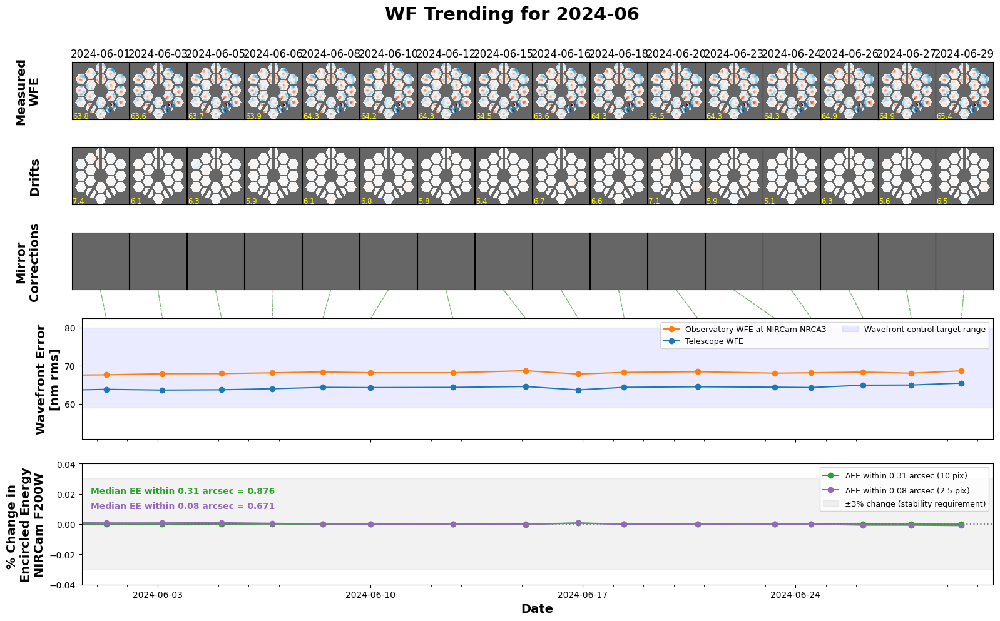

In [10]:
trend_table = webbpsf.trending.monthly_trending_plot(2024, 6, verbose=False)


In [13]:
trend_table

Date,Filename,WFS Type,RMS WFE (OTE+SI),RMS WFE (OTE only),EE(2.5 pix),EE(10pix)
,,,nm,nm,,
str23,str29,str7,float64,float64,float64,float64
2024-05-29T20:28:16.000,R2024053002-NRCA3_FP1-1.fits,Sensing,67.3914750239438,63.3709548042608,0.6719226329668622,0.8764040777120377
2024-06-01T07:23:31.400,R2024060102-NRCA3_FP1-1.fits,Sensing,67.58286840572377,63.77091225744318,0.671716224637393,0.876335154737071
2024-06-03T03:45:45.700,R2024060302-NRCA3_FP1-1.fits,Sensing,67.85527338663357,63.5824560042632,0.6717277183894746,0.8763239348265368
2024-06-05T02:32:29.000,O2024060501-NRCA3_FP1-1.fits,Sensing,67.89438388454889,63.6531276812743,0.6717958424990571,0.8764245973149773
2024-06-06T18:40:02.000,O2024060602-NRCA3_FP1-1.fits,Sensing,68.10348101293755,63.93035887498094,0.6715480464724863,0.8765101726668102
2024-06-08T10:33:16.100,O2024060801-NRCA3_FP1-1.fits,Sensing,68.35284319652992,64.30054670481502,0.6712569300298153,0.8764032913784519
2024-06-10T00:25:49.700,O2024061001-NRCA3_FP1-1.fits,Sensing,68.12892606755149,64.23481177221457,0.6712435376220325,0.8764395816200585
2024-06-12T17:17:56.200,O2024061301-NRCA3_FP1-1.fits,Sensing,68.13602214356894,64.29193242420945,0.6711962144562938,0.8764299998890757


<a id='time'></a>
### Wavefront time series and histogram plots


## We can retrieve a table of all available OPDs and plot the measurements over time:

In [44]:
opdtable = webbpsf.mast_wss.retrieve_mast_opd_table()


opdtable = webbpsf.mast_wss.deduplicate_opd_table(opdtable)


In [45]:
opdtable

date,date_obs_mjd,visitId,activity,apername,corr_id,fileName,dataURI,wfs_measurement_type,is_post_correction,is_pre_correction
str23,float64,str12,str5,str9,str11,str29,str47,str10,bool,bool
2022-03-11T19:37:04.200,59649.81740972222,V01160001001,02109,NRCA3_FP1,R2022031401,R2022031401-NRCA3_FP1-0.fits,mast:JWST/product/R2022031401-NRCA3_FP1-0.fits,post,True,False
2022-03-12T13:56:12.900,59650.58070486111,V01162001001,02101,NRCA3_FP1,R2022031401,R2022031401-NRCA3_FP1-1.fits,mast:JWST/product/R2022031401-NRCA3_FP1-1.fits,pre,False,False
2022-03-12T19:42:19.800,59650.8210625,V01162006001,02101,NRCA3_FP1,R2022031401,R2022031401-NRCA3_FP1-6.fits,mast:JWST/product/R2022031401-NRCA3_FP1-6.fits,pre,False,False
2022-03-13T02:02:19.300,59651.084945601855,V01162012001,02101,NRCA3_FP1,R2022031304,R2022031304-NRCA3_FP1-1.fits,mast:JWST/product/R2022031304-NRCA3_FP1-1.fits,pre,False,False
2022-03-14T15:44:07.500,59652.65564236111,V01163006001,02107,NRCA3_FP1,R2022031405,R2022031405-NRCA3_FP1-1.fits,mast:JWST/product/R2022031405-NRCA3_FP1-1.fits,post,True,False
2022-03-17T06:50:00.300,59655.284725694444,V01163001001,02101,NRCA3_FP1,R2022032002,R2022032002-NRCA3_FP1-0.fits,mast:JWST/product/R2022032002-NRCA3_FP1-0.fits,pre,False,False
2022-03-17T15:50:41.300,59655.66020023148,V01163003001,02101,NRCA3_FP1,R2022031703,R2022031703-NRCA3_FP1-1.fits,mast:JWST/product/R2022031703-NRCA3_FP1-1.fits,pre,False,False
2022-03-17T22:54:02.800,59655.954199074076,V01163004001,02107,NRCA3_FP1,R2022031801,R2022031801-NRCA3_FP1-1.fits,mast:JWST/product/R2022031801-NRCA3_FP1-1.fits,post,True,False
2022-03-18T05:18:33.700,59656.22122337963,V01163005001,02107,NRCA3_FP1,R2022032004,R2022032004-NRCA3_FP1-1.fits,mast:JWST/product/R2022032004-NRCA3_FP1-1.fits,post,True,False


In [47]:
webbpsf.mast_wss.download_all_opds(opdtable)

### You can download all the OPDs from the opdtable object. Note that some functions need to have all the OPDs available. 
`webbpsf.mast_wss.download_all_opds(opdtable)`

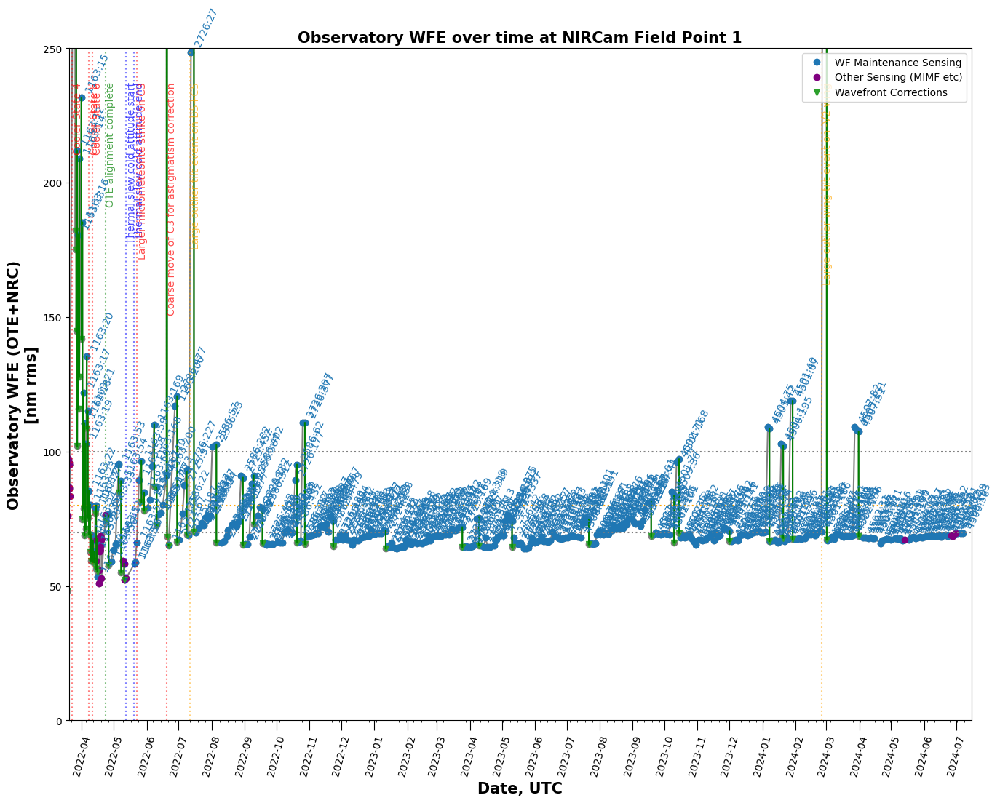

In [49]:
webbpsf.trending.wavefront_time_series_plot(opdtable)


##  Select a time range, depending on your observations


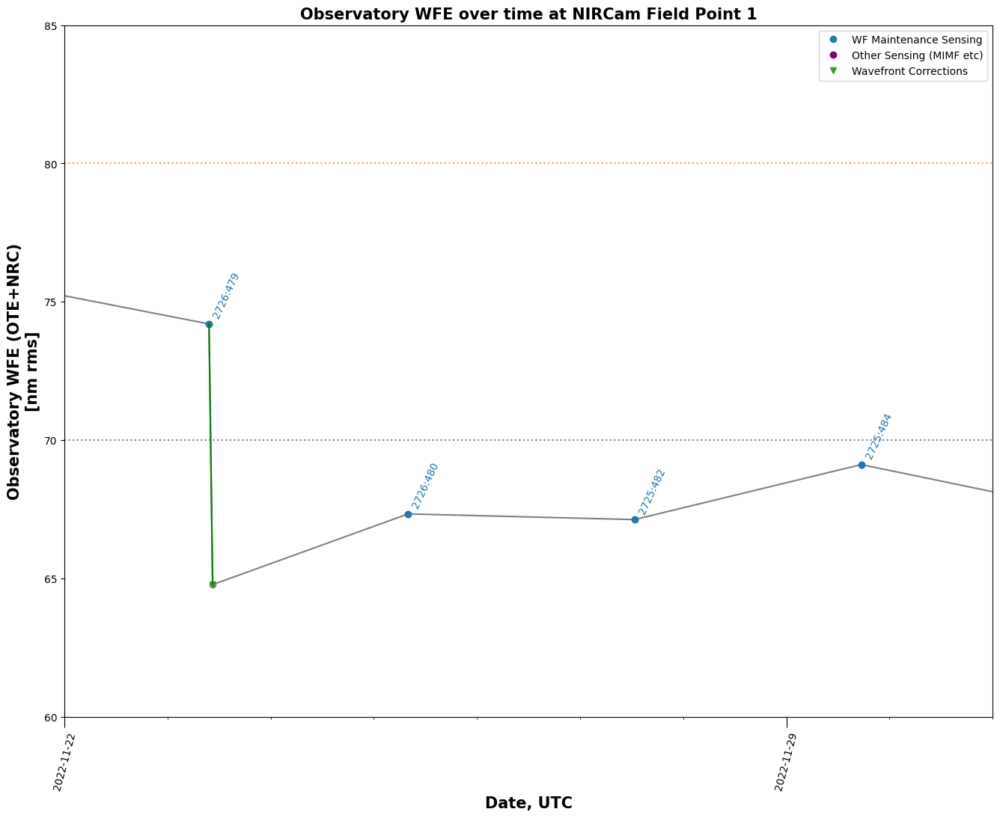

In [41]:
start_date =  datetime.datetime.fromisoformat('2022-11-22')
end_date =  datetime.datetime.fromisoformat('2022-12-01')
webbpsf.trending.wavefront_time_series_plot(opdtable, 
                                            start_date = start_date ,end_date = end_date, ymax = 85, ymin= 60
                                           ,label_visits=True, label_events=True)

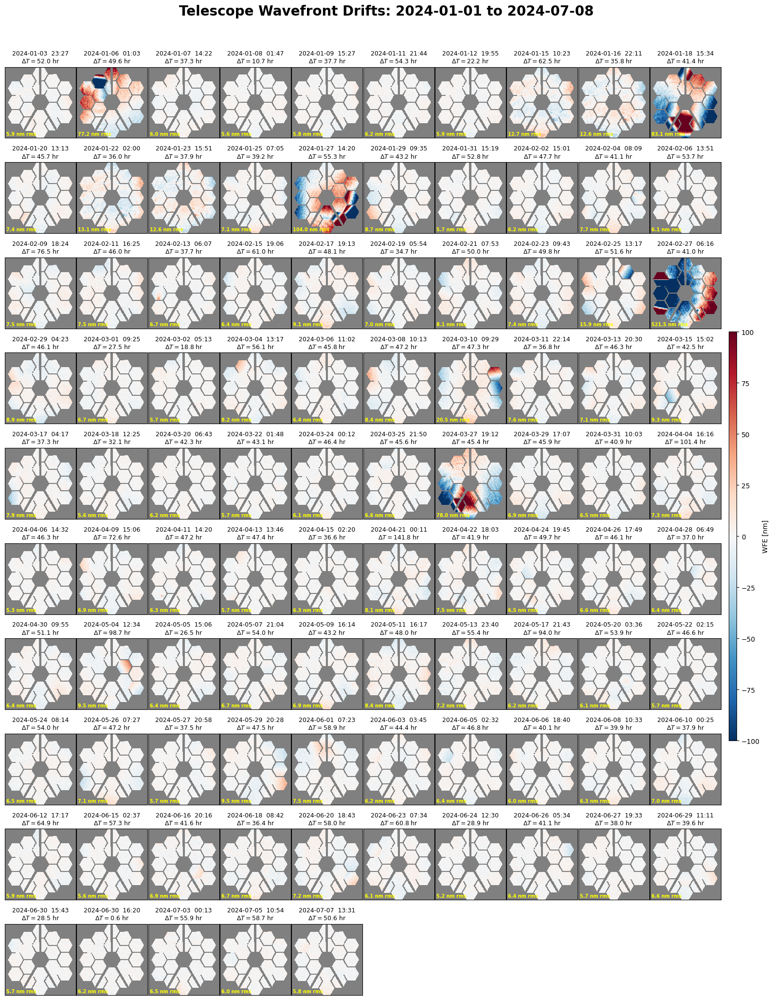

In [50]:
#We can also plot all measured wavefront drifts over specified time periods
start_time =  astropy.time.Time('2024-01-01T00:00:00')
end_time = astropy.time.Time.now()

webbpsf.trending.wavefront_drift_plots(opdtable, start_time=start_time, end_time=end_time, n_per_row=10)


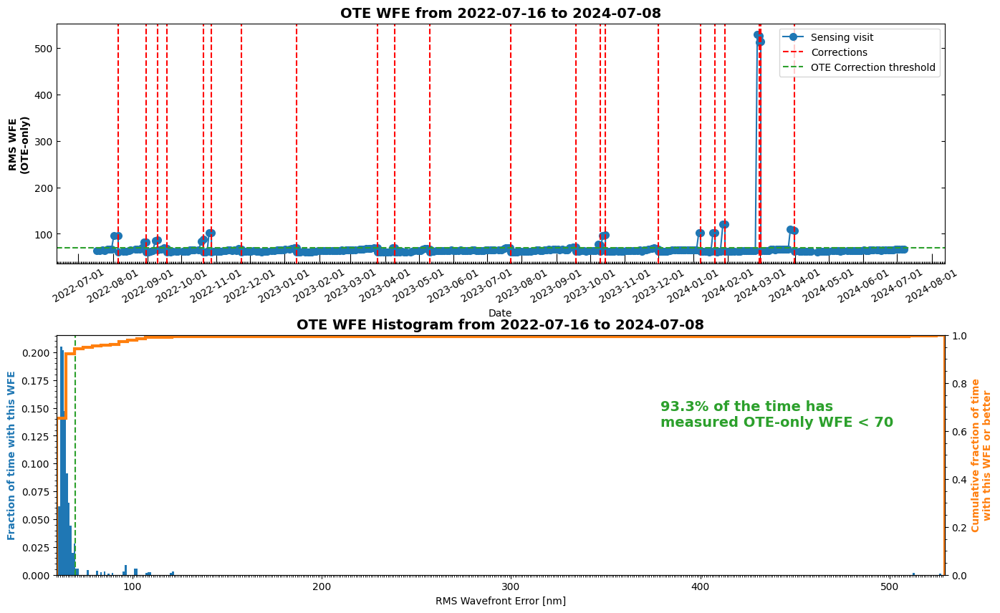

In [51]:
# we can plot histograms of wavefront error levels over time
webbpsf.trending.wfe_histogram_plot(opdtable,  thresh=70 , ote_only = True)

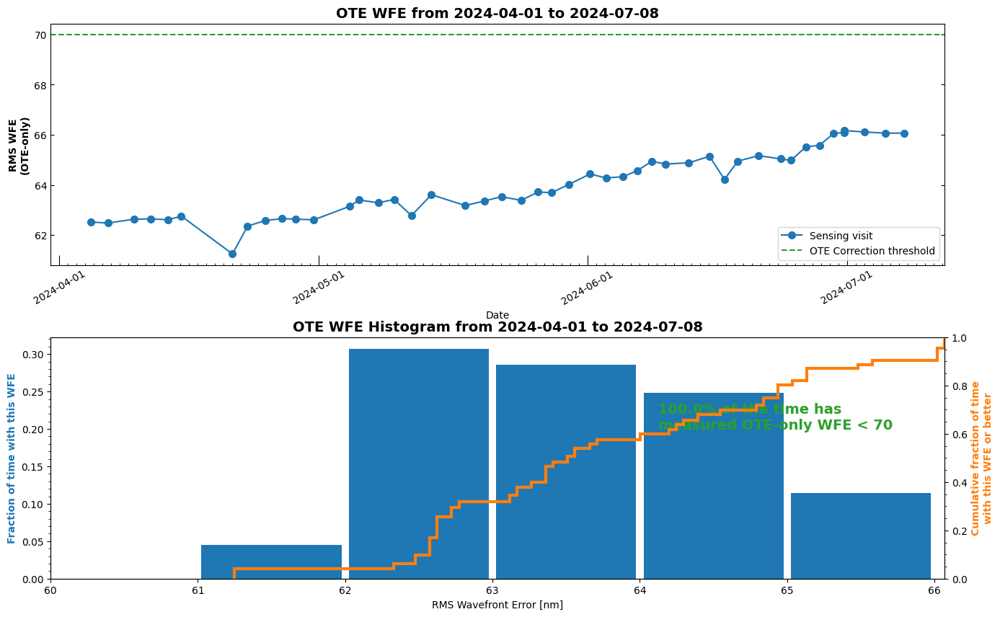

In [53]:
# or select a particular time period
start_date =  astropy.time.Time('2024-04-01')
end_date =  astropy.time.Time.now()
webbpsf.trending.wfe_histogram_plot(opdtable, start_date = start_date, thresh=70 , ote_only = True)

<a id='single'></a>
### Load a Single OPD
Inspect the OPD table above for an OPD around your observation

In [54]:

nrc = webbpsf.NIRCam()
nrc.filter =  'F212N'
opd_fn = 'R2022120204-NRCA3_FP1-1.fits'
nrc.load_wss_opd(opd_fn, output_path = output_path)
fov_pixels = 511
psf = nrc.calc_psf(oversample=4, fov_pixels = fov_pixels)

Found OPD file previously downloaded: R2022120204-NRCA3_FP1-1.fits
Importing and format-converting OPD from /ifs/jwst/tel/flight/WebbPSF-OPD/R2022120204-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point


In [55]:
psf.info()

Filename: (No file associated with this HDUList)
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  OVERSAMP      1 PrimaryHDU     104   (2044, 2044)   float64   
  1  DET_SAMP      1 ImageHDU       106   (511, 511)   float64   
  2  OVERDIST      1 ImageHDU       158   (2044, 2044)   float64   
  3  DET_DIST      1 ImageHDU       159   (511, 511)   float64   


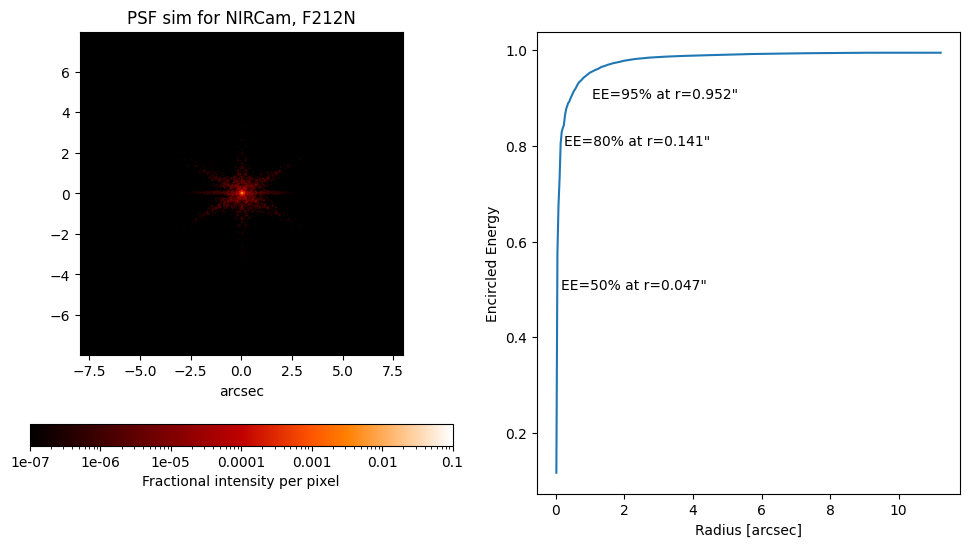

In [56]:
# display the PSF and plot the encircled energy
plt.figure(figsize=(12, 6))
plt.subplot(1,2,1)
webbpsf.display_psf(psf, colorbar_orientation='horizontal')
axis2 = plt.subplot(1,2,2)
webbpsf.display_ee(psf, ext = 1,ax=axis2)

<a id='psfsub'></a>
# JWST PSF Subtraction Using in-flight Simulations

https://webbpsf.readthedocs.io/en/latest/jwst_psf_subtraction.html



In [57]:
import photutils
import webbpsf
import matplotlib.pylab as plt
from astropy.nddata import Cutout2D
from astropy.visualization import simple_norm

In [58]:
file = 'jw02725-o484_t097_nircam_clear-f356w-nrcalong_wfscmb-04.fits'
mast_retrieve_files(file)

'./jw02725-o484_t097_nircam_clear-f356w-nrcalong_wfscmb-04.fits'

In [59]:
# Open and inspect observation
from astropy.io import fits
from photutils.background import Background2D, MedianBackground
from astropy.stats import SigmaClip
from photutils.detection import IRAFStarFinder


psf = fits.open(file)
data = psf['SCI'].data
mask = (psf['DQ'].data % 2).astype('bool')
sigma_clip = SigmaClip(sigma=3.0)
bkg_estimator = MedianBackground()
#norm = simple_norm(data1,  'log',min_cut = min_cut, max_cut = max_cut )
bkg = Background2D(data, (50, 50), filter_size=(3, 3),
                       sigma_clip=sigma_clip, bkg_estimator=bkg_estimator, mask = mask)

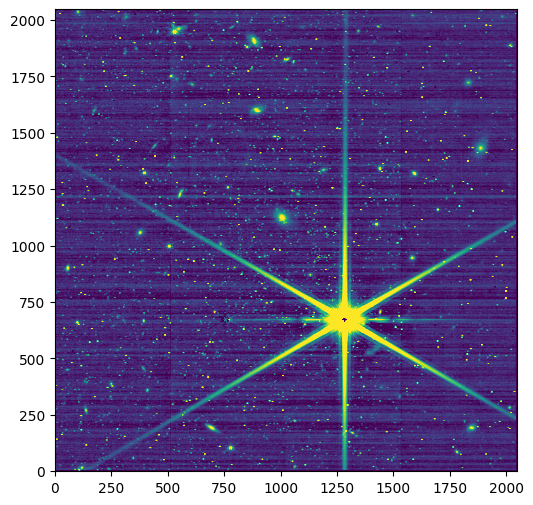

In [60]:
plt.figure(figsize = (6,6))
norm = simple_norm(data - bkg.background,  'asinh', min_percent = 20, max_percent=98.99 )
plt.imshow(data - bkg.background, norm = norm , origin = 'lower', cmap='viridis')

## Extract a subarray around a particular source of interest, and measure source location

In [61]:
position = (550, 1950)    # approximate location. This will be improved below.
size_pixels = 200         

Text(0.5, 1.0, 'Cutout around a galaxy merger and a star')

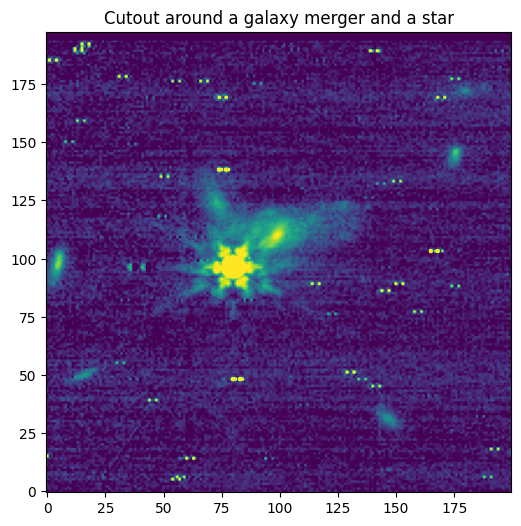

In [62]:
data_source = Cutout2D(data - bkg.background, position, size_pixels).data
plt.figure(figsize = (6,6))
norm = simple_norm(data_source,  'asinh',min_percent=20, max_percent=99.6 )
plt.imshow(data_source, norm = norm , origin = 'lower', cmap='viridis')
plt.title("Cutout around a galaxy merger and a star")

### Let's find the source

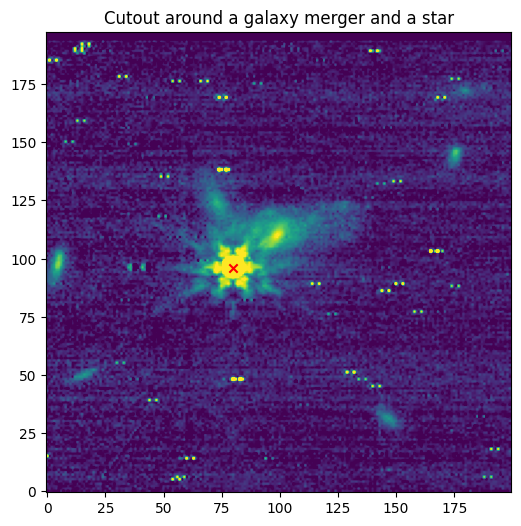

In [64]:
starfind = IRAFStarFinder(fwhm=3.0, threshold=100.*bkg.background_median)
sources = starfind(data_source)
plt.figure(figsize = (6,6))
plt.imshow(data_source, norm = norm , origin = 'lower', cmap='viridis')
plt.title("Cutout around a galaxy merger and a star")
plt.scatter(sources['xcentroid'], sources['ycentroid'], color='red', marker='x')

(530.024178293244, 1946.067039647067)


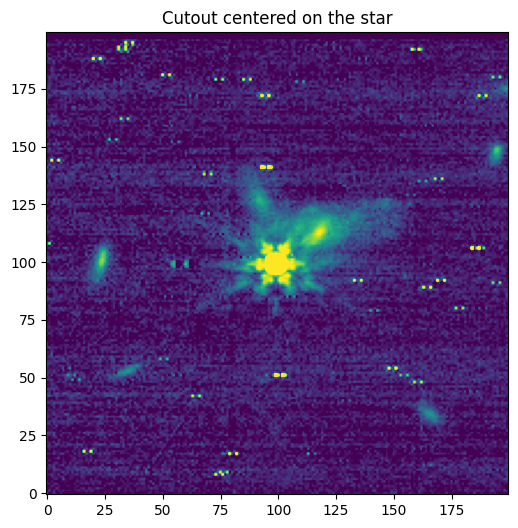

In [65]:
# Let's re-center the image 
positions_original = Cutout2D(data - bkg.background, position, size_pixels).to_original_position((sources['xcentroid'],sources['ycentroid']))
position = (positions_original[0].value[0], positions_original[1].value[0])
size = 200
data_source = Cutout2D(data - bkg.background, position, size_pixels).data

plt.figure(figsize = (6,6))
norm = simple_norm(data_source,  'asinh',min_percent=20, max_percent=99.6 )
plt.imshow(data_source, norm = norm , origin = 'lower', cmap='viridis')
plt.title("Cutout centered on the star")
print(position)

### Let's use our previous function to setup our simulation

In [66]:
inst = webbpsf.setup_sim_to_match_file(file)
inst.detector_position = position

single_webbpsf_nrc = inst.calc_psf(fov_pixels=size_pixels)

Setting up sim to match jw02725-o484_t097_nircam_clear-f356w-nrcalong_wfscmb-04.fits
iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-11-29T17:26:06.893
                        MJD: 59912.72646866898

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/R2022112903-NRCA3_FP1-1.fits
	Date (MJD):	 59912.7265
	Delta time:	 -0.0000 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022120203-NRCA3_FP1-1.fits
	Date (MJD):	 59915.1683
	Delta time:	 2.4418 days
User requested choosing OPD time closest in time to 2022-11-29T17:26:06.893, which is R2022112903-NRCA3_FP1-1.fits, delta time -0.000 days
Importing and format-converting OPD from /Users/melendez/WFSC_Flight/webbpsf-data/MAST_JWST_WSS_OPDs/R2022112903-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point

Configured simulation instrument for:
    Instrument: NIRCam
    Filter: F356W
    Detector: NRCA5
    Apername: NRCA5_FULL
    Det. Pos.: 

In [75]:
single_webbpsf_nrc[3].header

XTENSION= 'IMAGE   '           / Image extension                                
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  200                                                  
NAXIS2  =                  200                                                  
PCOUNT  =                    0 / number of parameters                           
GCOUNT  =                    1 / number of groups                               
PLANE1  = 'Wavefront Intensity'                                                 
WAVELEN = 3.52998044562017E-06 / Weighted mean wavelength in meters             
DIFFLMT =   0.0976844608559387 / Diffraction limit lambda/D in arcsec           
OVERSAMP=                    1 / These data are rebinned to detector pixels     
DET_SAMP=                    4 / Oversampling factor for MFT to detector plane  
PIXELSCL=           0.062907

### We use photutils to create our model PSF
#### We’ll use photutils to fit and subtract the PSF from the data. First, we take the output simulated PSF and convert it into a photutils fittable model:

In [67]:
webbpsf_model = photutils.psf.FittableImageModel(single_webbpsf_nrc['DET_DIST'].data, normalize=True, oversampling=1)


In [69]:

from photutils.detection import DAOStarFinder
from photutils.psf import PSFPhotometry
fit_shape = (5, 5)
psfphot = PSFPhotometry(webbpsf_model, fit_shape, finder=starfind,
                        aperture_radius=4)

# fit model PSF to background subtracted data
phot = psfphot(data_source)

#### We check the location of the source to be subtracted 

In [70]:
print(phot) #single source

 id group_id local_bkg      x_init          y_init         flux_init           x_fit       ...        y_err             flux_err     npixfit group_size         qfit                 cfit         flags
--- -------- --------- --------------- --------------- ------------------ ---------------- ... ------------------- ----------------- ------- ---------- ------------------- --------------------- -----
  1        1       0.0 99.024178293244 99.067039647067 3328.1781920824656 99.0218190151787 ... 0.02463645064189303 75.75458090875529      25          1 0.08165903959837983 -0.012449800305231356     0


#### After a successful PSF fit then we can create a residual image and display the results



In [71]:
residual =  psfphot.make_residual_image(data_source, (size_pixels, size_pixels))


Text(0.5, 1.0, 'Clean - PSFPhotometry zoom')

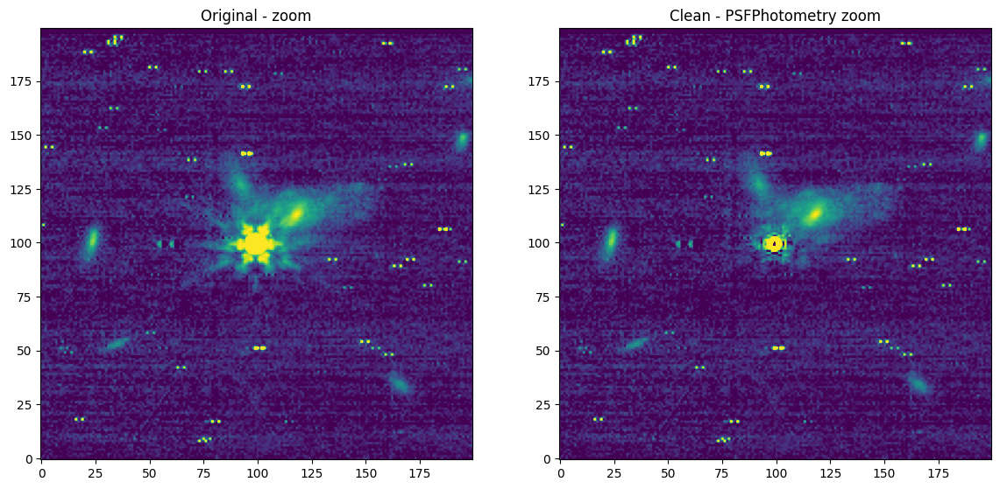

In [72]:
plt.figure(figsize = (14,16))

plt.subplot(1,2,1)
plt.imshow(data_source, norm = norm , origin = 'lower', cmap='viridis')
plt.title('Original - zoom')

plt.subplot(1,2,2)
plt.imshow(residual, norm = norm , origin = 'lower', cmap='viridis')
plt.title('Clean - PSFPhotometry zoom')

<a id='psfdiff'></a>
### PSF properties and differences 


In [77]:
pixelscale = nrc.pixelscale 
ee_pixel_radius = 2.5
ee_arcsec_radius = ee_pixel_radius * pixelscale
ee_psf = poppy.measure_ee(single_webbpsf_nrc, ext = 3, normalize='total')
ee_val = ee_psf(ee_arcsec_radius)
print("ee ({}px, {:.3f}arsec)  = {:.4f}".format(ee_pixel_radius,ee_arcsec_radius,ee_val.item(0)))

ee (2.5px, 0.078arsec)  = 0.5124


In [78]:
def measure_fwhm(array):
    """Fit a Gaussian2D model to a PSF and return the fitted PSF
    the FWHM is x and y can be found with fitted_psf.x_fwhm, fitted_psf.y_fwhm

    Parameters
    ----------
    array : numpy.ndarray
        Array containing PSF

    Returns
    -------
    x_fwhm : float
        FWHM in x direction in units of pixels

    y_fwhm : float
        FWHM in y direction in units of pixels
        
    x_mean : float
        x centroid position in units of pixels
    
    y_mean : float
        y centroid position in units of pixels
    
    """
    yp, xp = array.shape
    y, x, = np.mgrid[:yp, :xp]
    p_init = models.Gaussian2D(amplitude = array.max(), x_mean=xp*0.5,y_mean=yp*0.5)
    fit_p = fitting.LevMarLSQFitter()
    fitted_psf = fit_p(p_init, x, y, array)
    return fitted_psf


In [79]:
fitted_psf = measure_fwhm(single_webbpsf_nrc["DET_SAMP"].data)
print("FWHM X-direction: {:.3f}, FWHM y-direction: {:.2f}".format(fitted_psf.x_fwhm,fitted_psf.y_fwhm))

FWHM X-direction: 1.835, FWHM y-direction: 1.88


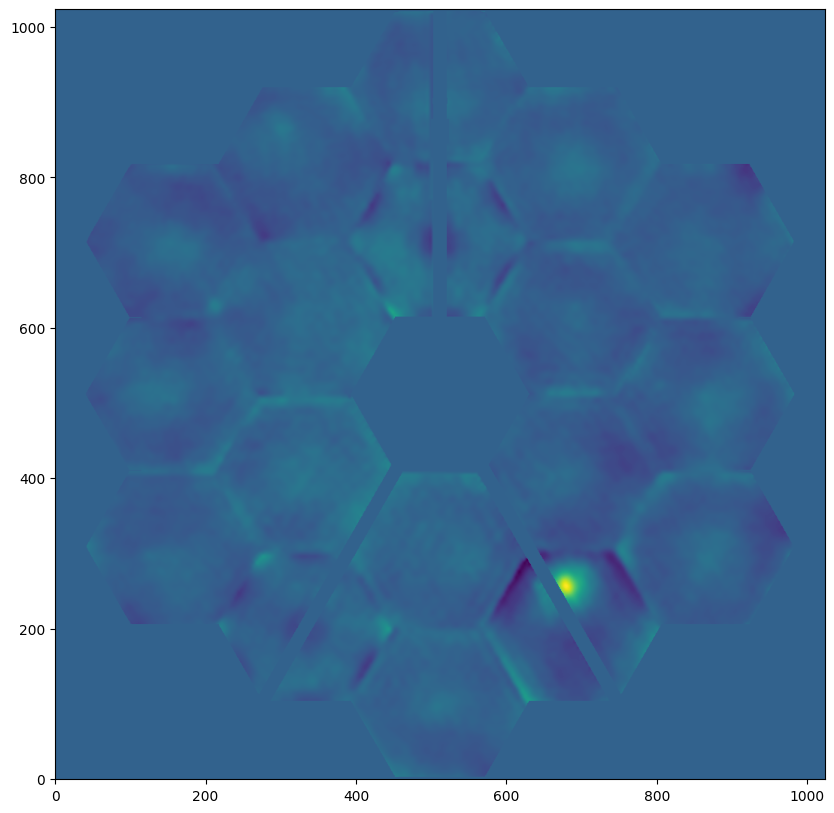

In [80]:
#Note that the OPD is loaded in WebbPSF instrument object
#norm = ImageNormalize(stretch=LinearStretch(), vmin = 1e-9 , vmax = 1e-7)
plt.figure(figsize = [10,10])
plt.imshow(nrc.pupilopd[0].data,  origin = 'lower')



In [81]:
#check OPD header information
nrc.pupilopd[0].header

SIMPLE  =                    T / Written by IDL:  Fri Dec  2 22:39:16 2022      
BITPIX  =                  -64 / Number of bits per data pixel                  
NAXIS   =                    2 / Number of data axes                            
NAXIS1  =                 1024                                                  
NAXIS2  =                 1024                                                  
EXTEND  =                    T / FITS data may contain extensions               
DATE    = '2022-12-02'         / Creation UTC (CCCC-MM-DD) date of FITS header  
COMMENT FITS (Flexible Image Transport System) format is defined in 'Astronomy  
COMMENT and Astrophysics', volume 376, page 359; bibcode 2001A&A...376..359H    
FILECONT= 'Analysis output products' /                                          
TSTAMP  = '2022-12-02T22:39:16' /                                               
DATE-OBS= '2022-12-02'         /                                                
TIME-OBS= '04:02:21.595'    

In [86]:
# Let's calculate the difference between two different times
# We can use the same instrument setup from before
opd_fn = 'R2022120404-NRCA3_FP1-1.fits'
inst.load_wss_opd(opd_fn)
psf2 = inst.calc_psf(fov_pixels=size_pixels)



Found OPD file previously downloaded: R2022120404-NRCA3_FP1-1.fits
Importing and format-converting OPD from /Users/melendez/WFSC_Flight/webbpsf-data/MAST_JWST_WSS_OPDs/R2022120404-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point


In [87]:
pixelscale = nrc.pixelscale
ee_pixel_radius = 2.5
ee_arcsec_radius = ee_pixel_radius * pixelscale
ee_psf = poppy.measure_ee(psf2, ext = 1, normalize='total')
ee_val = ee_psf(ee_arcsec_radius)
print("ee ({}px, {:.3f}arsec)  = {:.4f}".format(ee_pixel_radius,ee_arcsec_radius,ee_val.item(0)))

ee (2.5px, 0.078arsec)  = 0.5545


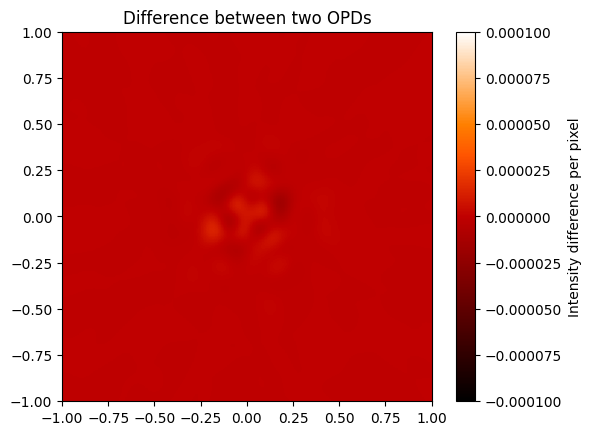

In [88]:
webbpsf.display_psf_difference(single_webbpsf_nrc, psf2, imagecrop = 2 , title = 'Difference between two OPDs', cmap = 'gist_heat')

In [34]:
def miri_psfs_for_ee():
    miri = webbpsf.MIRI()

    #opd_fn = 'R2022120404-NRCA3_FP1-1.fits'
    #miri.load_wss_opd(opd_fn, output_path = output_path)
    miri.load_wss_opd_by_date('2022-07-12T00:00:00',plot=True, output_path = output_path)

    for wave in [5.0, 7.5, 10, 14]:

        fov=18

        outname = "PSF_MIRI_%.1fum_wfed.fits" % (wave)
        psf = miri.calc_psf(outname, monochromatic=wave*1e-6,
                oversample=4, fov_arcsec=fov,  display=True)



def plot_ee_curves():
    plt.clf()
    for iw, wave in enumerate([5.0, 7.5, 10, 14]):

        ees60 = []
        ees51 = []
        ax = plt.subplot(2,2,iw+1)
       
        name = "PSF_MIRI_%.1fum_wfed.fits" % (wave)
        webbpsf.display_ee(name, ax=ax, mark_levels=False)

        eefn = webbpsf.measure_ee(name)
        ees60.append(eefn(0.60))
        ees51.append(eefn(0.51))

        ax.text(1, 0.6, 'Mean EE inside 0.60": %.3f' % np.asarray(ees60).mean())
        ax.text(1, 0.5, 'Mean EE inside 0.51": %.3f' % np.asarray(ees51).mean())

        ax.set_title("Wavelength = %.1f $\mu$m" % wave)

        ax.axvline(0.6, ls=":", color='k')
        ax.axvline(0.51, ls=":", color='k')


    plt.tight_layout()

iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-07-12T00:00:00.000
                        MJD: 59772.0

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022071001-NRCA3_FP1-0.fits
	Date (MJD):	 59770.4830
	Delta time:	 -1.5170 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022071302-NRCA3_FP1-1.fits
	Date (MJD):	 59772.6632
	Delta time:	 0.6632 days
User requested choosing OPD time closest in time to 2022-07-12T00:00:00.000, which is R2022071302-NRCA3_FP1-1.fits, delta time 0.663 days
Importing and format-converting OPD from /ifs/jwst/tel/flight/WebbPSF-OPD/R2022071302-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point


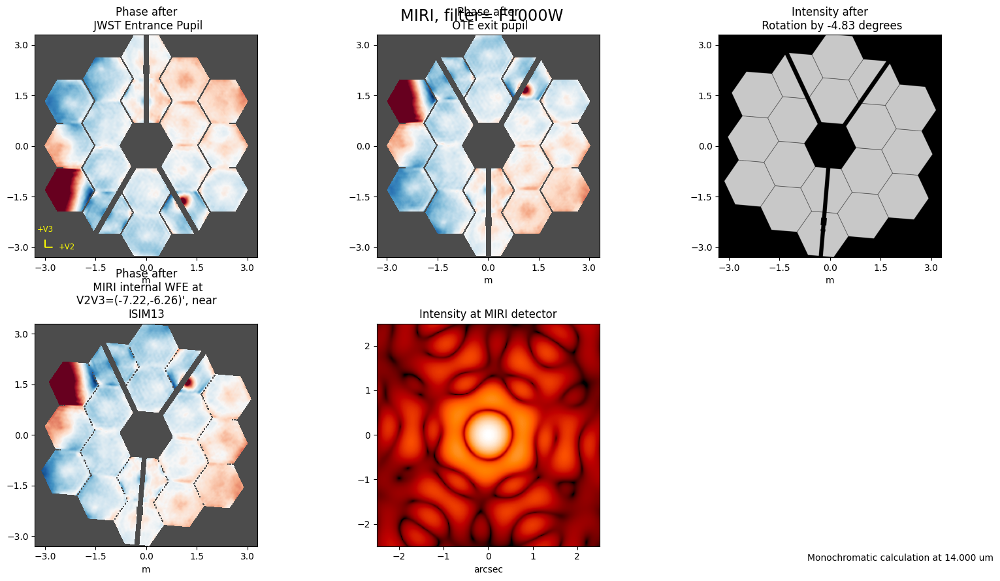

In [35]:
miri_psfs_for_ee()

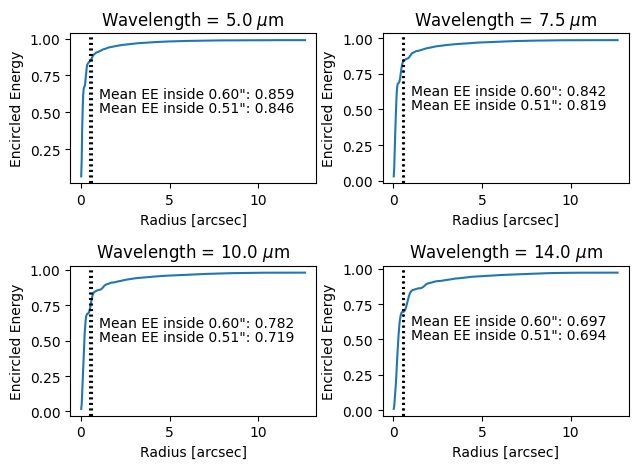

In [38]:
plot_ee_curves()

Found OPD file previously downloaded: R2022120404-NRCA3_FP1-1.fits
Importing and format-converting OPD from /ifs/jwst/tel/flight/WebbPSF-OPD/R2022120404-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point


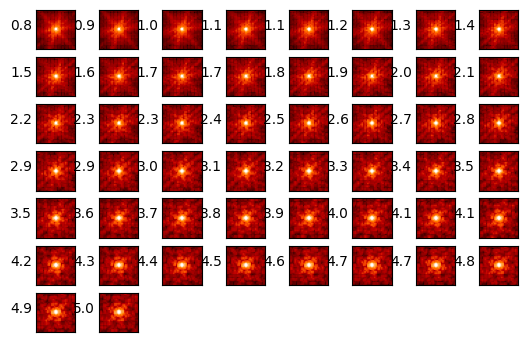

In [40]:
nsp = webbpsf.NIRSpec()
                                           # or you can specify a full path name.
nsp.options['parity'] = 'odd'                 # please make an output PSF with its center
                                             # aligned to the center of a single pixel

opd_fn = 'R2022120404-NRCA3_FP1-1.fits'
nsp.load_wss_opd(opd_fn, output_path = output_path)

    
waves = np.linspace(0.8, 5, 50)*1e-6     # iterate over wavelengths in meters
#waves = np.linspace(5.0, 28.3, 20)*1e-6     # iterate over wavelengths in meters

for iw, wavelength in enumerate(waves):
    psffile = 'psf_NIRSPec_mono_%.1fum_opd1.fits' % (wavelength*1e6)
    psf = nsp.calc_psf(fov_arcsec=3, oversample=4,  monochromatic=wavelength, display=False,
               outfile=psffile)
    ax = plt.subplot(8,8,iw+1)
    webbpsf.display_psf(psffile, ext='DET_SAMP', colorbar=False, imagecrop=8)
    ax.set_title('')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.text(-3.5, 0, '{0:.1f}'.format(wavelength*1e6))

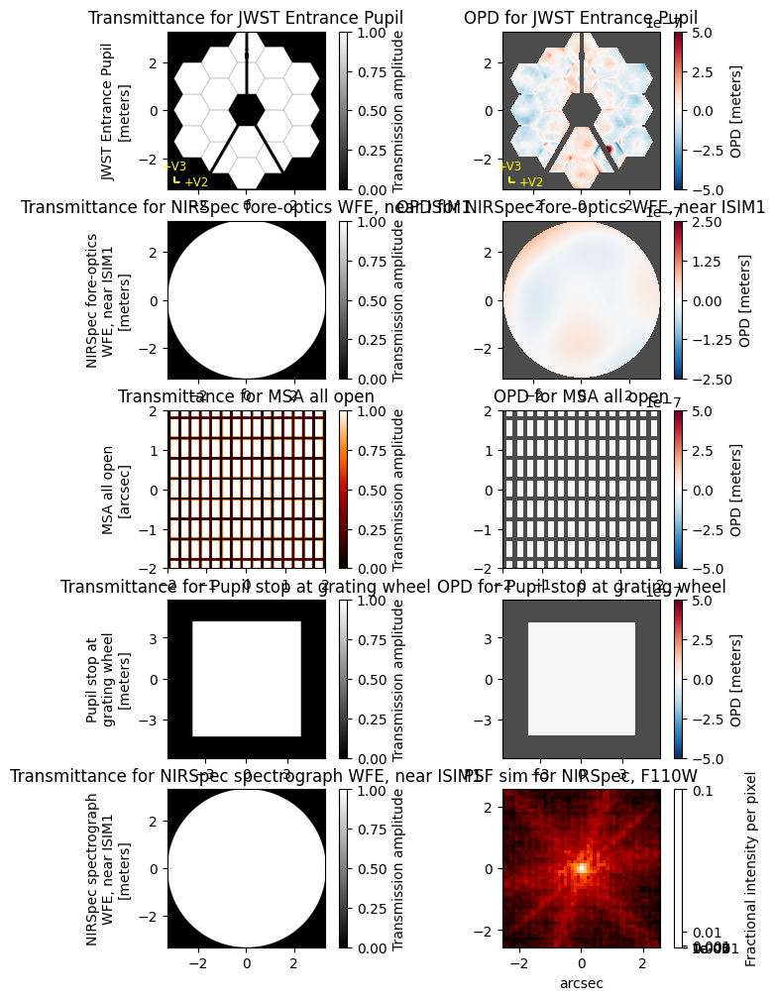

In [41]:
plt.figure(figsize=(8, 12))
nsp.image_mask='MSA all open'
nsp.display()
msapsf = nsp.calc_psf(monochromatic=2e-6, oversample=8)
webbpsf.display_psf(msapsf, ext='DET_SAMP')

In [42]:
def miri_psfs_for_ee():
    miri = webbpsf.MIRI()

    #opd_fn = 'R2022120404-NRCA3_FP1-1.fits'
    #miri.load_wss_opd(opd_fn, output_path = output_path)
    miri.load_wss_opd_by_date('2022-07-12T00:00:00',plot=True, output_path = output_path)

    for wave in [5.0, 7.5, 10, 14]:

        fov=18

        outname = "PSF_MIRI_%.1fum_wfed.fits" % (wave)
        psf = miri.calc_psf(outname, monochromatic=wave*1e-6,
                oversample=4, fov_arcsec=fov,  display=True)



def plot_ee_curves():
    plt.clf()
    for iw, wave in enumerate([5.0, 7.5, 10, 14]):

        ees60 = []
        ees51 = []
        ax = plt.subplot(2,2,iw+1)
       
        name = "PSF_MIRI_%.1fum_wfed.fits" % (wave)
        webbpsf.display_ee(name, ax=ax, mark_levels=False)

        eefn = webbpsf.measure_ee(name)
        ees60.append(eefn(0.60))
        ees51.append(eefn(0.51))

        ax.text(1, 0.6, 'Mean EE inside 0.60": %.3f' % np.asarray(ees60).mean())
        ax.text(1, 0.5, 'Mean EE inside 0.51": %.3f' % np.asarray(ees51).mean())

        ax.set_title("Wavelength = %.1f $\mu$m" % wave)

        ax.axvline(0.6, ls=":", color='k')
        ax.axvline(0.51, ls=":", color='k')


    plt.tight_layout()

iterating query, tdelta=3.0

MAST OPD query around UTC: 2022-07-12T00:00:00.000
                        MJD: 59772.0

OPD immediately preceding the given datetime:
	URI:	 mast:JWST/product/O2022071001-NRCA3_FP1-0.fits
	Date (MJD):	 59770.4830
	Delta time:	 -1.5170 days

OPD immediately following the given datetime:
	URI:	 mast:JWST/product/R2022071302-NRCA3_FP1-1.fits
	Date (MJD):	 59772.6632
	Delta time:	 0.6632 days
User requested choosing OPD time closest in time to 2022-07-12T00:00:00.000, which is R2022071302-NRCA3_FP1-1.fits, delta time 0.663 days
Importing and format-converting OPD from /ifs/jwst/tel/flight/WebbPSF-OPD/R2022071302-NRCA3_FP1-1.fits
Backing out SI WFE and OTE field dependence at the WF sensing field point


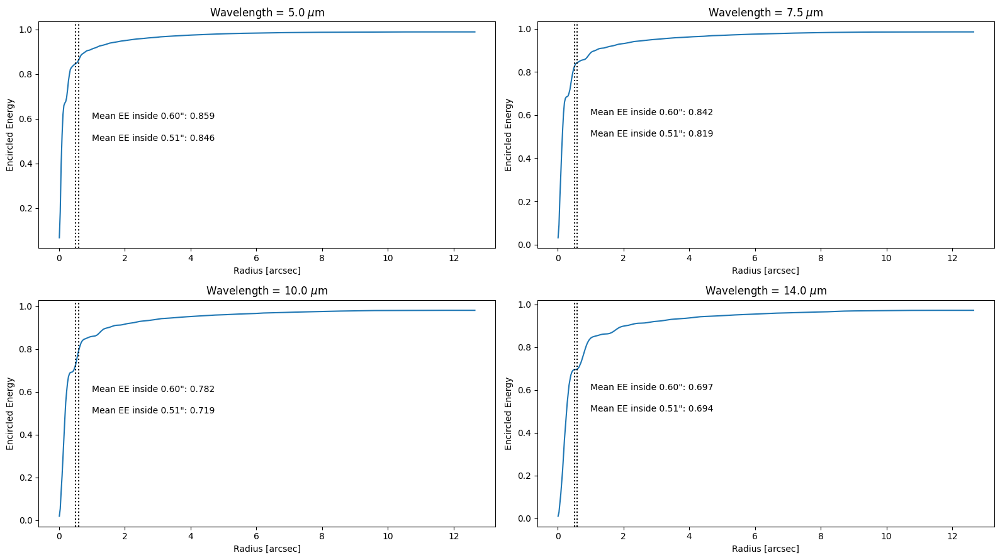

In [44]:
miri_psfs_for_ee()
plot_ee_curves()

<a id='ifu'></a>
# Improved IFU sims

In [4]:
miri = webbpsf.MIRI()
miri.mode = 'IFU'
miri.band= '2A'
waves = miri.get_IFU_wavelengths()
cube = miri.calc_datacube_fast(waves)

/Users/melendez/webbpsf_fix_unit_bug_in_fast_datacube/webbpsf/opds.py:1759: UserWarning: For (V2,V3) = [-8.39108833 -5.32144667] arcmin, Field point -8.254199999999999 arcmin, -2.478553333333333 arcmin not within valid region for field dependence model of OTE WFE for MIRI: -8.254199999999999 arcmin--6.21738 arcmin, -2.557224 arcmin--0.5632056 arcmin.  Clipping to closest available valid location, 0.13688833333333505 arcmin away from the requested coordinates.
  warnings.warn(warning_message)


In [6]:
cube.info()

Filename: (No file associated with this HDUList)
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  OVERSAMP      1 PrimaryHDU    1075   (284, 284, 970)   float64   


In [ ]:
nrs = webbpsf.NIRSpec()
nrs.mode = 'IFU'
nrs.disperser = 'PRISM'
nrs.filter = 'CLEAR'
waves = nrs.get_IFU_wavelengths()
cube = nrs.calc_datacube_fast(waves)